In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
% matplotlib inline

READ TEXT DATA

In [2]:
# read text captions
def readTextFile(path):
    with open(path) as f:
        captions = f.read()
    return captions

In [3]:
captions = readTextFile("Flickr_Data/Flickr_TextData/Flickr8k.token.txt")
print(len(captions.split("\n")))

40461


In [4]:
captions = captions.split("\n")[0:-1] # last line in file is empty

In [5]:
captions[0] # 0th line

'1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .'

In [6]:
captions

['1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg#1\tA girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg#2\tA little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg#3\tA little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg#4\tA little girl in a pink dress going into a wooden cabin .',
 '1001773457_577c3a7d70.jpg#0\tA black dog and a spotted dog are fighting',
 '1001773457_577c3a7d70.jpg#1\tA black dog and a tri-colored dog playing with each other on the road .',
 '1001773457_577c3a7d70.jpg#2\tA black dog and a white dog with brown spots are staring at each other in the street .',
 '1001773457_577c3a7d70.jpg#3\tTwo dogs of different breeds looking at each other on the road .',
 '1001773457_577c3a7d70.jpg#4\tTwo dogs on pavement moving toward each other .',
 '1002674143_1b742ab4b8.jpg#0\tA little girl covered in paint sits in front of a pai

In [7]:
print(len(captions))

40460


In [8]:
# make a dictionary mapping each image to the captions it corresponds to.
d = {}

In [9]:
for cap in captions:
    first, second = cap.split("\t")
    img_id = first.split(".")[0]
    if d.get(img_id) is None: # check if image_id is already present in dictionary
        d[img_id] = []
    d[img_id].append(second)

In [10]:
d["1009434119_febe49276a"]

['A black and white dog is running in a grassy garden surrounded by a white fence .',
 'A black and white dog is running through the grass .',
 'A Boston terrier is running in the grass .',
 'A Boston Terrier is running on lush green grass in front of a white fence .',
 'A dog runs on the green grass near a wooden fence .']

In [11]:
d

{'1000268201_693b08cb0e': ['A child in a pink dress is climbing up a set of stairs in an entry way .',
  'A girl going into a wooden building .',
  'A little girl climbing into a wooden playhouse .',
  'A little girl climbing the stairs to her playhouse .',
  'A little girl in a pink dress going into a wooden cabin .'],
 '1001773457_577c3a7d70': ['A black dog and a spotted dog are fighting',
  'A black dog and a tri-colored dog playing with each other on the road .',
  'A black dog and a white dog with brown spots are staring at each other in the street .',
  'Two dogs of different breeds looking at each other on the road .',
  'Two dogs on pavement moving toward each other .'],
 '1002674143_1b742ab4b8': ['A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .',
  'A little girl is sitting in front of a large painted rainbow .',
  'A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .',
  'There is a gi

In [12]:
len(d)*5

40460

In [13]:
IMG_PATH = "/Flickr_Data/Images/"
import cv2
import matplotlib.pyplot as plt

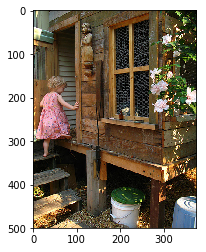

In [14]:
img = cv2.imread("C:\ANACONDA\Scripts\MINOR PROJECT IMAGE CAPTIONING" + IMG_PATH+"1000268201_693b08cb0e.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [15]:
d["1000268201_693b08cb0e"]

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

DATA CLEANING

In [16]:
import re

In [17]:
def clean_text(sentence):
    sentence = sentence.lower()
    sentence = re.sub("[^a-z]+"," ",sentence)
    sentence = sentence.split()
    
    sentence = [s for s in sentence if len(s) > 1]
    sentence = " ".join(sentence)
    return sentence

In [18]:
# clean all captions
for key, caption_list in d.items():
    for i in range(len(caption_list)):
        caption_list[i] = clean_text(caption_list[i])

In [19]:
d["1000268201_693b08cb0e"]

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [20]:
#store the data in text file
with open("descriptions_1.txt", "w") as f:
    f.write(str(d))

CREATE VOCAB OF UNIQUE WORDS

In [21]:
import json
descriptions = None
with open("descriptions_1.txt") as f:
    descriptions = f.read()

json_acceptable_string = descriptions.replace("'", "\"")
descriptions = json.loads(json_acceptable_string)

In [22]:
print(type(descriptions))

<class 'dict'>


In [23]:
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [24]:
vocab = set()
for key in descriptions.keys():
    [vocab.update(sentence.split()) for sentence in descriptions[key]]

In [25]:
vocab

{'hangs',
 'lenses',
 'fiving',
 'spangles',
 'persue',
 'patrick',
 'crosswalks',
 'tending',
 'comfort',
 'statefarm',
 'arrives',
 'braids',
 'furious',
 'artists',
 'calmer',
 'children',
 'utensils',
 'feild',
 'directs',
 'backstroke',
 'wodden',
 'fourth',
 'purchased',
 'swooping',
 'seating',
 'amusement',
 'fairground',
 'littered',
 'birthday',
 'will',
 'creative',
 'smells',
 'italy',
 'limo',
 'spotted',
 'booklets',
 'desperate',
 'cami',
 'shape',
 'kelp',
 'rakes',
 'at',
 'strolling',
 'waterhole',
 'pointer',
 'enclosure',
 'cheers',
 'else',
 'racing',
 'merchandise',
 'square',
 'jumpsuites',
 'glides',
 'mets',
 'firework',
 'eggs',
 'bulldog',
 'oddly',
 'juming',
 'burnt',
 'cafe',
 'crouched',
 'modern',
 'puppy',
 'shaded',
 'capped',
 'passengers',
 'forwards',
 'villages',
 'hunter',
 'shephard',
 'royal',
 'stool',
 'sponsors',
 'present',
 'drags',
 'abdomen',
 'sillhouetted',
 'wedgie',
 'patiently',
 'anything',
 'fangs',
 'north',
 'chinatown',
 'clear'

In [26]:
print(len(vocab))

8424


In [27]:
# total no of words across all sentences
total_words = []
for key in descriptions.keys():
    [total_words.append(i) for des in descriptions[key] for i in des.split()]
print(len(total_words))

373837


In [28]:
print(total_words[:10])

['child', 'in', 'pink', 'dress', 'is', 'climbing', 'up', 'set', 'of', 'stairs']


REMOVE INFREQUENT WORDS - pick only those words out of vocab that appear atleast 10 times in total_words

In [29]:
# find out frequency counts in total_words
import collections
counter = collections.Counter(total_words)
freq_cnt = dict(counter)
print(freq_cnt)

{'child': 1545, 'in': 18987, 'pink': 739, 'dress': 348, 'is': 9345, 'climbing': 507, 'up': 1302, 'set': 109, 'of': 6723, 'stairs': 109, 'an': 2432, 'entry': 1, 'way': 53, 'girl': 3328, 'going': 149, 'into': 1074, 'wooden': 284, 'building': 511, 'little': 1768, 'playhouse': 6, 'the': 18420, 'to': 3176, 'her': 1178, 'cabin': 4, 'black': 3848, 'dog': 8138, 'and': 8863, 'spotted': 38, 'are': 3505, 'fighting': 133, 'tri': 14, 'colored': 221, 'playing': 2008, 'with': 7765, 'each': 430, 'other': 773, 'on': 10746, 'road': 398, 'white': 3959, 'brown': 2578, 'spots': 29, 'staring': 57, 'at': 2916, 'street': 944, 'two': 5643, 'dogs': 2125, 'different': 46, 'breeds': 5, 'looking': 744, 'pavement': 48, 'moving': 41, 'toward': 146, 'covered': 372, 'paint': 62, 'sits': 577, 'front': 1386, 'painted': 64, 'rainbow': 22, 'hands': 246, 'bowl': 30, 'sitting': 1368, 'large': 1237, 'small': 1278, 'grass': 1622, 'plays': 526, 'fingerpaints': 3, 'canvas': 6, 'it': 401, 'there': 304, 'pigtails': 14, 'painting'

In [30]:
len(freq_cnt.keys())

8424

In [31]:
# sort the dictionary acc to freq counts
sorted_freq_cnt = sorted(freq_cnt.items(), reverse = True, key = lambda x : x[1])
sorted_freq_cnt

[('in', 18987),
 ('the', 18420),
 ('on', 10746),
 ('is', 9345),
 ('and', 8863),
 ('dog', 8138),
 ('with', 7765),
 ('man', 7275),
 ('of', 6723),
 ('two', 5643),
 ('white', 3959),
 ('black', 3848),
 ('boy', 3581),
 ('are', 3505),
 ('woman', 3403),
 ('girl', 3328),
 ('to', 3176),
 ('wearing', 3062),
 ('at', 2916),
 ('people', 2887),
 ('water', 2790),
 ('red', 2691),
 ('young', 2630),
 ('brown', 2578),
 ('an', 2432),
 ('his', 2357),
 ('blue', 2279),
 ('dogs', 2125),
 ('running', 2073),
 ('through', 2032),
 ('playing', 2008),
 ('while', 1968),
 ('shirt', 1962),
 ('down', 1843),
 ('standing', 1789),
 ('ball', 1783),
 ('little', 1768),
 ('grass', 1622),
 ('snow', 1547),
 ('child', 1545),
 ('person', 1542),
 ('jumping', 1473),
 ('over', 1415),
 ('three', 1389),
 ('front', 1386),
 ('sitting', 1368),
 ('holding', 1324),
 ('up', 1302),
 ('field', 1283),
 ('small', 1278),
 ('by', 1249),
 ('large', 1237),
 ('green', 1234),
 ('one', 1223),
 ('group', 1218),
 ('yellow', 1217),
 ('her', 1178),
 ('walk

In [32]:
threshold = 10
sorted_freq_cnt = [x for x in sorted_freq_cnt if x[1] > threshold]
sorted_freq_cnt

[('in', 18987),
 ('the', 18420),
 ('on', 10746),
 ('is', 9345),
 ('and', 8863),
 ('dog', 8138),
 ('with', 7765),
 ('man', 7275),
 ('of', 6723),
 ('two', 5643),
 ('white', 3959),
 ('black', 3848),
 ('boy', 3581),
 ('are', 3505),
 ('woman', 3403),
 ('girl', 3328),
 ('to', 3176),
 ('wearing', 3062),
 ('at', 2916),
 ('people', 2887),
 ('water', 2790),
 ('red', 2691),
 ('young', 2630),
 ('brown', 2578),
 ('an', 2432),
 ('his', 2357),
 ('blue', 2279),
 ('dogs', 2125),
 ('running', 2073),
 ('through', 2032),
 ('playing', 2008),
 ('while', 1968),
 ('shirt', 1962),
 ('down', 1843),
 ('standing', 1789),
 ('ball', 1783),
 ('little', 1768),
 ('grass', 1622),
 ('snow', 1547),
 ('child', 1545),
 ('person', 1542),
 ('jumping', 1473),
 ('over', 1415),
 ('three', 1389),
 ('front', 1386),
 ('sitting', 1368),
 ('holding', 1324),
 ('up', 1302),
 ('field', 1283),
 ('small', 1278),
 ('by', 1249),
 ('large', 1237),
 ('green', 1234),
 ('one', 1223),
 ('group', 1218),
 ('yellow', 1217),
 ('her', 1178),
 ('walk

In [33]:
total_words = [x[0] for x in sorted_freq_cnt]

In [34]:
total_words

['in',
 'the',
 'on',
 'is',
 'and',
 'dog',
 'with',
 'man',
 'of',
 'two',
 'white',
 'black',
 'boy',
 'are',
 'woman',
 'girl',
 'to',
 'wearing',
 'at',
 'people',
 'water',
 'red',
 'young',
 'brown',
 'an',
 'his',
 'blue',
 'dogs',
 'running',
 'through',
 'playing',
 'while',
 'shirt',
 'down',
 'standing',
 'ball',
 'little',
 'grass',
 'snow',
 'child',
 'person',
 'jumping',
 'over',
 'three',
 'front',
 'sitting',
 'holding',
 'up',
 'field',
 'small',
 'by',
 'large',
 'green',
 'one',
 'group',
 'yellow',
 'her',
 'walking',
 'children',
 'men',
 'into',
 'air',
 'beach',
 'near',
 'mouth',
 'jumps',
 'another',
 'for',
 'street',
 'runs',
 'its',
 'from',
 'riding',
 'stands',
 'as',
 'bike',
 'girls',
 'outside',
 'other',
 'off',
 'out',
 'rock',
 'next',
 'play',
 'orange',
 'looking',
 'pink',
 'player',
 'camera',
 'their',
 'pool',
 'hat',
 'jacket',
 'boys',
 'women',
 'around',
 'behind',
 'some',
 'background',
 'dirt',
 'toy',
 'soccer',
 'sits',
 'dressed',
 

In [35]:
len(total_words)

1845

PREPARE TRAIN TEST DATA

In [36]:
train_file_data = readTextFile("Flickr_Data/Flickr_TextData/Flickr_8k.trainImages.txt")
test_file_data = readTextFile("Flickr_Data/Flickr_TextData/Flickr_8k.testImages.txt")

In [37]:
print(train_file_data)

2513260012_03d33305cf.jpg
2903617548_d3e38d7f88.jpg
3338291921_fe7ae0c8f8.jpg
488416045_1c6d903fe0.jpg
2644326817_8f45080b87.jpg
218342358_1755a9cce1.jpg
2501968935_02f2cd8079.jpg
2699342860_5288e203ea.jpg
2638369467_8fc251595b.jpg
2926786902_815a99a154.jpg
2851304910_b5721199bc.jpg
3423802527_94bd2b23b0.jpg
3356369156_074750c6cc.jpg
2294598473_40637b5c04.jpg
1191338263_a4fa073154.jpg
2380765956_6313d8cae3.jpg
3197891333_b1b0fd1702.jpg
3119887967_271a097464.jpg
2276499757_b44dc6f8ce.jpg
2506892928_7e79bec613.jpg
2187222896_c206d63396.jpg
2826769554_85c90864c9.jpg
3097196395_ec06075389.jpg
3603116579_4a28a932e2.jpg
3339263085_6db9fd0981.jpg
2532262109_87429a2cae.jpg
2076906555_c20dc082db.jpg
2502007071_82a8c639cf.jpg
3113769557_9edbb8275c.jpg
3325974730_3ee192e4ff.jpg
1655781989_b15ab4cbff.jpg
1662261486_db967930de.jpg
2410562803_56ec09f41c.jpg
2469498117_b4543e1460.jpg
69710415_5c2bfb1058.jpg
3414734842_beb543f400.jpg
3006217970_90b42e6b27.jpg
2192411521_9c7e488c5e.jpg
3535879138_9281d

In [38]:
print(type(train_file_data))

<class 'str'>


In [39]:
train = [row.split(".")[0] for row in train_file_data.split("\n")[:-1]]
print(train[:10])

['2513260012_03d33305cf', '2903617548_d3e38d7f88', '3338291921_fe7ae0c8f8', '488416045_1c6d903fe0', '2644326817_8f45080b87', '218342358_1755a9cce1', '2501968935_02f2cd8079', '2699342860_5288e203ea', '2638369467_8fc251595b', '2926786902_815a99a154']


In [40]:
test = [row.split(".")[0] for row in test_file_data.split("\n")[:-1]]
print(test[:10])

['3385593926_d3e9c21170', '2677656448_6b7e7702af', '311146855_0b65fdb169', '1258913059_07c613f7ff', '241347760_d44c8d3a01', '2654514044_a70a6e2c21', '2339106348_2df90aa6a9', '256085101_2c2617c5d0', '280706862_14c30d734a', '3072172967_630e9c69d0']


In [41]:
len(train), len(test)

(6000, 1000)

In [42]:
# prepare descriptions for the training data 
# add start and end token to the training data
train_descriptions = {}
for img_id in train:
    train_descriptions[img_id] = []
    for cap in descriptions[img_id]:
        cap_to_append = "startseq " + cap + " endseq"
        train_descriptions[img_id].append(cap_to_append)

In [43]:
train_descriptions

{'2513260012_03d33305cf': ['startseq black dog is running after white dog in the snow endseq',
  'startseq black dog chasing brown dog through snow endseq',
  'startseq two dogs chase each other across the snowy ground endseq',
  'startseq two dogs play together in the snow endseq',
  'startseq two dogs running through low lying body of water endseq'],
 '2903617548_d3e38d7f88': ['startseq little baby plays croquet endseq',
  'startseq little girl plays croquet next to truck endseq',
  'startseq the child is playing croquette by the truck endseq',
  'startseq the kid is in front of car with put and ball endseq',
  'startseq the little boy is playing with croquet hammer and ball beside the car endseq'],
 '3338291921_fe7ae0c8f8': ['startseq brown dog in the snow has something hot pink in its mouth endseq',
  'startseq brown dog in the snow holding pink hat endseq',
  'startseq brown dog is holding pink shirt in the snow endseq',
  'startseq dog is carrying something pink in its mouth whil

In [44]:
import pickle
with open("train_descriptions.pkl", "wb") as f:
    pickle.dump(train_descriptions, f)

# TRANFER LEARNING

FEATURE EXTRACTION FROM IMAGES AND TEXT

STEP 1 - IMAGE FEATURE EXTRACTION

In [45]:
import keras
import numpy as np

Using TensorFlow backend.


In [46]:
from keras.applications.resnet50 import ResNet50

In [47]:
from keras.models import load_model

In [48]:
resnet_model = load_model("resnet_model.hdf5")

C:\ANACONDA\lib\site-packages\keras\engine\saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [49]:
resnet_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [50]:
from keras.models import Model
model_new = Model(resnet_model.input, resnet_model.layers[-2].output)

In [51]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.resnet50 import preprocess_input

In [52]:
def preprocess_img(img):
    img = load_img(img, target_size=(224,224))
    img = img_to_array(img)
    img = np.expand_dims(img, axis = 0)
    img = preprocess_input(img)
    return img

In [53]:
im = "C:\ANACONDA\Scripts\MINOR PROJECT IMAGE CAPTIONING" + IMG_PATH+"56494233_1824005879.jpg"

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


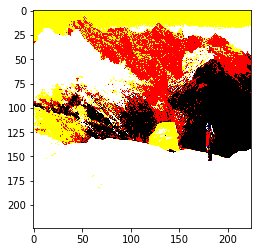

In [54]:
img = preprocess_img(im)
plt.imshow(img[0])
# image after preprocessing

In [55]:
print(img)

[[[[115.061     14.221001 -56.68    ]
   [110.061     13.221001 -59.68    ]
   [112.061     12.221001 -58.68    ]
   ...
   [132.061     34.221    -42.68    ]
   [128.061     37.221    -45.68    ]
   [129.061     34.221    -44.68    ]]

  [[114.061     14.221001 -59.68    ]
   [117.061     17.221    -55.68    ]
   [118.061     16.221    -57.68    ]
   ...
   [138.061     36.221    -37.68    ]
   [135.061     40.221    -43.68    ]
   [134.061     40.221    -41.68    ]]

  [[115.061     17.221    -51.68    ]
   [120.061     22.221    -54.68    ]
   [118.061     20.221    -54.68    ]
   ...
   [139.061     42.221    -36.68    ]
   [136.061     38.221    -30.68    ]
   [136.061     39.221    -32.68    ]]

  ...

  [[148.061    110.221     77.32    ]
   [135.061    103.221     69.32    ]
   [140.061     98.221     64.32    ]
   ...
   [149.061    136.22101  129.32    ]
   [149.061    136.22101  129.32    ]
   [149.061    136.22101  129.32    ]]

  [[142.061    117.221     82.32    ]
   [140

In [56]:
def encode_image(img):
    img = preprocess_img(img)
    feature_vector = model_new.predict(img)
    feature_vector = feature_vector.reshape((-1,))
    #print(feature_vector.shape)
    return feature_vector

In [57]:
encode_image("C:\ANACONDA\Scripts\MINOR PROJECT IMAGE CAPTIONING" +IMG_PATH+"56494233_1824005879.jpg")

array([0.7869591 , 0.6670176 , 0.01559329, ..., 0.        , 0.        ,
       0.        ], dtype=float32)

In [58]:
import pickle

In [59]:
encoding_train = pickle.load(open("encoded_train_features.pkl", "rb"))

In [60]:
len(encoding_train)

6000

In [61]:
encoding_train

{'2513260012_03d33305cf': array([0.28047287, 0.406874  , 0.08379951, ..., 0.91079134, 0.04341812,
        0.09577895], dtype=float32),
 '2903617548_d3e38d7f88': array([0.        , 0.00240233, 0.07777371, ..., 0.32226387, 0.33870834,
        0.82707775], dtype=float32),
 '3338291921_fe7ae0c8f8': array([0.6499905 , 0.45327264, 0.35990563, ..., 0.01184102, 0.17420349,
        0.04910808], dtype=float32),
 '488416045_1c6d903fe0': array([0.5911424 , 0.24315509, 0.        , ..., 1.1071402 , 0.44211772,
        0.41112903], dtype=float32),
 '2644326817_8f45080b87': array([0.0837353 , 0.55374855, 0.03665285, ..., 0.11103823, 1.0484872 ,
        0.        ], dtype=float32),
 '218342358_1755a9cce1': array([1.5750589 , 0.3306428 , 0.34105495, ..., 0.2440799 , 0.03760232,
        0.03851033], dtype=float32),
 '2501968935_02f2cd8079': array([0.08495852, 1.2882218 , 0.03415355, ..., 0.15635864, 0.5512884 ,
        1.3358811 ], dtype=float32),
 '2699342860_5288e203ea': array([0.34909672, 0.30768737, 

In [62]:
encoding_test = pickle.load(open("encoded_test_features.pkl", "rb"))

In [63]:
len(encoding_test)

1000

In [64]:
encoding_test

{'3385593926_d3e9c21170': array([0.28236082, 0.31681818, 0.04513453, ..., 0.7442413 , 0.2965144 ,
        0.9206255 ], dtype=float32),
 '2677656448_6b7e7702af': array([0.23350716, 0.05166651, 0.6242703 , ..., 0.00522086, 0.2621777 ,
        0.08686393], dtype=float32),
 '311146855_0b65fdb169': array([0.00912151, 0.07213554, 0.1220706 , ..., 0.02203188, 1.131882  ,
        0.03855705], dtype=float32),
 '1258913059_07c613f7ff': array([0.02427822, 1.2347254 , 0.07595192, ..., 0.08897056, 0.09812839,
        1.938419  ], dtype=float32),
 '241347760_d44c8d3a01': array([0.05051163, 6.319989  , 0.312008  , ..., 0.0537944 , 0.01552991,
        0.02812621], dtype=float32),
 '2654514044_a70a6e2c21': array([1.7663001 , 0.03384983, 0.10334536, ..., 0.00532028, 0.6680157 ,
        0.39294168], dtype=float32),
 '2339106348_2df90aa6a9': array([0.06683169, 1.0869431 , 0.07896071, ..., 0.01411186, 0.13114332,
        0.09507984], dtype=float32),
 '256085101_2c2617c5d0': array([0.5742952 , 0.51020306, 0

DATA LOADER

In [65]:
from keras.preprocessing.sequence import pad_sequences

In [66]:
# generator remembers the state of the function in the previous call
def data_generator(train_descriptions, encoding_train, word_to_idx, max_len, batch_size):
    X1, X2, y = [], [], []
    n = 0
    while True:
        for key, desc_list in train_descriptions.items():
            n += 1
            photo = encoding_train[key]
            for desc in desc_list:
                seq = [word_to_idx[word] for word in desc.split() if word in word_to_idx]
                for i in range(1, len(seq)):
                    xi = seq[0:i]
                    yi = seq[i]
                    xi = pad_sequences([xi], maxlen = max_len, value = 0, padding= 'post')[0] # value=0 denotes the padding word
                    yi = to_categorical([yi], num_classes = vocab_size)[0] # one hot encoding of the word corresponding to y
                    
                    # make a mini batch
                    X1.append(photo)
                    X2.append(xi)
                    y.append(yi)
                    
                    if n == batch_size:
                        yield ([np.array(X1), np.array(X2)], np.array(y))
                        
                        # prepare for next iteration
                        X1, X2, y = [],[],[]
                        n = 0

PREPROCESSING FOR CAPTIONS

In [67]:
len(total_words)

1845

In [68]:
word_to_idx = {}
idx_to_word = {}
for i, word in enumerate(total_words):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

In [69]:
word_to_idx['dog']

6

In [70]:
idx_to_word[6]

'dog'

In [71]:
print(len(idx_to_word))

1845


In [72]:
idx_to_word[1846] = 'startseq'
word_to_idx['startseq'] = 1846

In [73]:
idx_to_word[1847] = 'endseq'
word_to_idx['endseq'] = 1847

In [74]:
print(len(idx_to_word))

1847


In [75]:
vocab_size = len(word_to_idx) + 1
print(vocab_size)

1848


In [76]:
# find out the length of longest sentence
max_len = 0
for key in train_descriptions.keys():
    for cap in train_descriptions[key]:
        max_len = max(max_len,len(cap.split()))

In [77]:
max_len

35

In [78]:
with open("word_to_idx", "wb") as f:
    pickle.dump(word_to_idx, f)

TEXT FEATURE EXTRACTION USING TRANSFER LEARNING (GLOVE EMBEDDINGS)

In [79]:
f = open("glove.6B.50d.txt", encoding = "utf8")

In [80]:
# create a dictionary mapping each word in the glove embedding text file to its corresponding glove embedding
embedding_index = {}

In [81]:
for line in  f:
    values = line.split()
    word = values[0]
    word_embedding = np.array(values[1:], dtype = 'float')
    embedding_index[word] = word_embedding
f.close()

In [82]:
embedding_index['house']

array([ 0.60137  ,  0.28521  , -0.032038 , -0.43026  ,  0.74806  ,
        0.26223  , -0.97361  ,  0.078581 , -0.57588  , -1.188    ,
       -1.8507   , -0.24887  ,  0.055549 ,  0.0086155,  0.067951 ,
        0.40554  , -0.073998 , -0.21318  ,  0.37167  , -0.71791  ,
        1.2234   ,  0.35546  , -0.41537  , -0.21931  , -0.39661  ,
       -1.7831   , -0.41507  ,  0.29533  , -0.41254  ,  0.020096 ,
        2.7425   , -0.9926   , -0.71033  , -0.46813  ,  0.28265  ,
       -0.077639 ,  0.3041   , -0.06644  ,  0.3951   , -0.70747  ,
       -0.38894  ,  0.23158  , -0.49508  ,  0.14612  , -0.02314  ,
        0.56389  , -0.86188  , -1.0278   ,  0.039922 ,  0.20018  ])

In [83]:
def get_embedding_matrix():
    emb_dim = 50
    matrix = np.zeros((vocab_size, emb_dim))
    for word, idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)
        if embedding_vector is not None: # if word is not in glove.txt file, take it as all zeros
            matrix[idx] = embedding_vector
    return matrix

In [84]:
embedding_matrix = get_embedding_matrix()

In [85]:
embedding_matrix.shape

(1848, 50)

In [86]:
embedding_matrix[1847], embedding_matrix[1846] # glove vector for startseq and endseg - all 0s

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))

In [87]:
type(embedding_matrix)

numpy.ndarray

In [88]:
with open("embedding_matrix.pkl", "wb") as f:
    pickle.dump(embedding_matrix, f)

MODEL ARCHITECTURE

In [89]:
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Add
from keras.models import Model

In [90]:
vocab_size

1848

In [91]:
input_img_features = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_features)
inp_img2 = Dense(256, activation='relu')(inp_img1)

In [92]:
input_captions = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim = vocab_size, output_dim = 50, mask_zero = True)(input_captions)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

In [93]:
decoder1 = Add()([inp_img2, inp_cap3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation = 'softmax')(decoder2)

In [94]:
model = Model(inputs = [input_img_features, input_captions], outputs=outputs) # combined model

In [95]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 35)           0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 35, 50)       92400       input_2[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 2048)         0           input_1[0][0]                    
__________________________________________________________________________________________________
dropout_2 

In [96]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [97]:
model.compile(loss = "categorical_crossentropy", optimizer= "adam")

TRAINING OF MODEL

In [98]:
epochs = 20
batch_size = 3
steps = len(train_descriptions)//batch_size
from keras.utils.np_utils import to_categorical

In [99]:
len(train_descriptions)

6000

In [100]:
model = load_model('./model_weights/model_19.h5')

In [101]:
model

PREDICTIONS

In [102]:
def predict_caption(photo):
    in_text = "startseq"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence], maxlen = max_len, padding = 'post')
        ypred = model.predict([photo, sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text += (' '+ word)
        if word == 'endseq':
            break
    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)
    return final_caption

group of people are sitting in pool


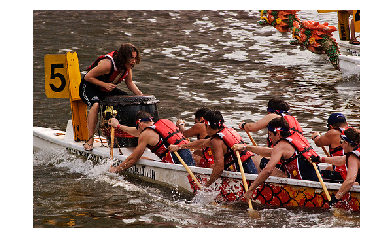

In [103]:
idx = np.random.randint(0, 1000)
img_name = list(encoding_test.keys())[idx]
photo_2048 = encoding_test[img_name].reshape((1, 2048))
i = plt.imread("Flickr_Data/Images/" + img_name +'.jpg')
caption = predict_caption(photo_2048)
print(caption)
plt.axis("off")
plt.imshow(i)

dog running through the grass


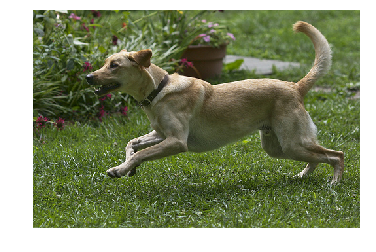

In [104]:
img_name = list(encoding_test.keys())[5]
photo_2048 = encoding_test[img_name].reshape((1, 2048))
i = plt.imread("Flickr_Data/Images/" + img_name +'.jpg')
caption = predict_caption(photo_2048)
print(caption)
plt.axis("off")
plt.imshow(i)

boy in wetsuit is running on the beach


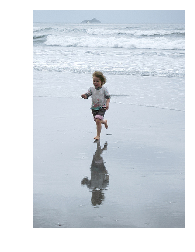

In [105]:
img_name = list(encoding_test.keys())[110]
photo_2048 = encoding_test[img_name].reshape((1, 2048))
i = plt.imread("Flickr_Data/Images/" + img_name +'.jpg')
caption = predict_caption(photo_2048)
print(caption)
plt.axis("off")
plt.imshow(i)

In [106]:
def display_img_and_caption(img_number):
    img_name = list(encoding_test.keys())[img_number]
    photo_2048 = encoding_test[img_name].reshape((1, 2048))
    i = plt.imread("Flickr_Data/Images/" + img_name +'.jpg')
    caption = predict_caption(photo_2048)
    print(caption)
    plt.axis("off")
    plt.imshow(i)
    plt.show()

two dogs are running through the snow


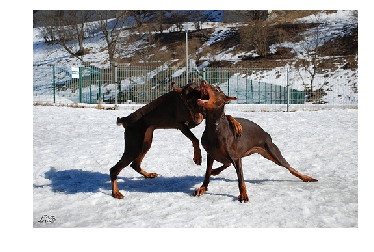

boy in goggles is playing with blue ball


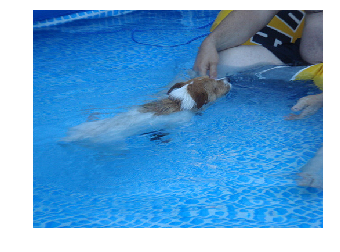

two young boys are sitting on the edge of vehicle


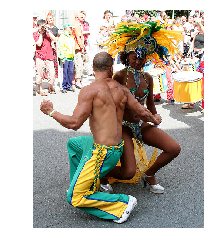

dog jumps over an obstacle


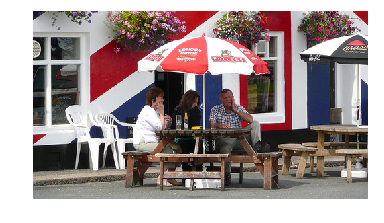

football player in sooners


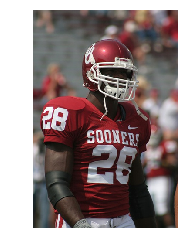

dog running through the grass


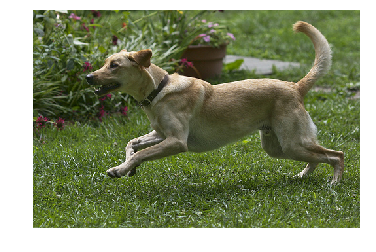

group of people are standing in front of white flowers


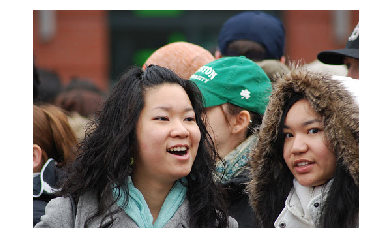

brown and white dog with black collar barking on the green grass


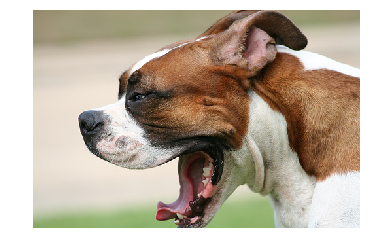

black dog is running through the snow


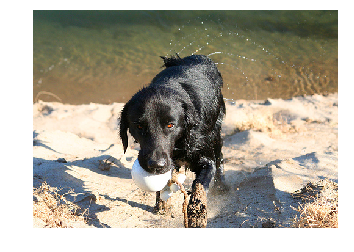

basketball player in white uniform is shot player in white for the player in white


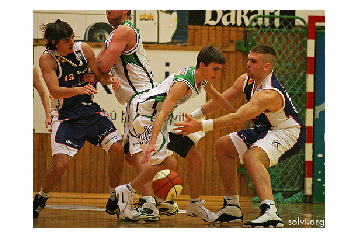

group of people are standing on the pavement of the fountain


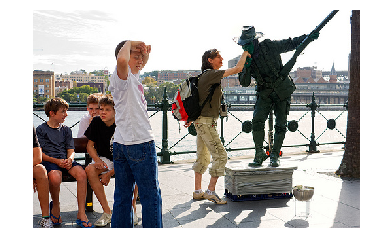

man with nose and glasses is gun


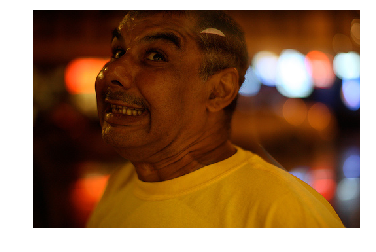

man in blue shirt is sitting on blanket with his hands on the wall


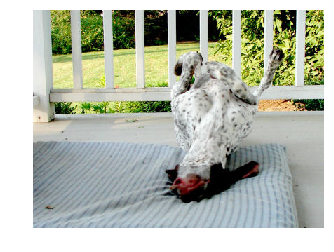

two men are standing in front of building


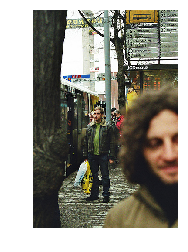

man in blue shirt and jeans is standing on top of mountain


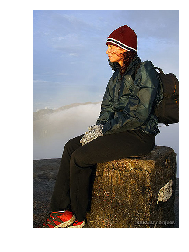

two men in hats are standing in front of an old building


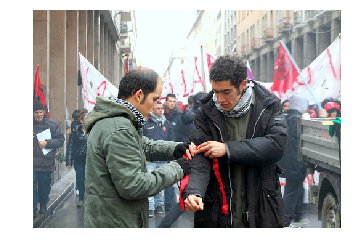

black dog running through field


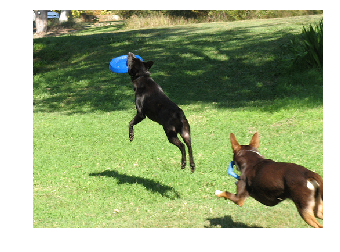

little boy is playing with giant shaped


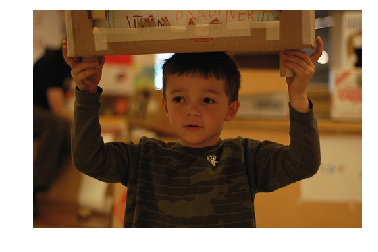

two dogs are running through field of grass


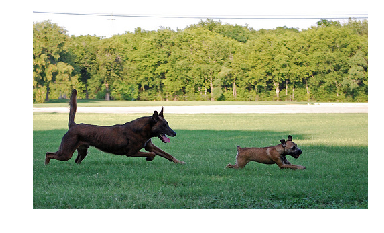

man in black shirt sits on chair with his feet up


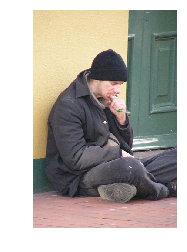

man is standing on top of mountain and looks at the mountains below him


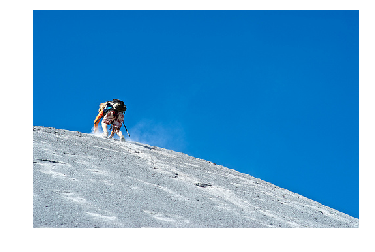

two people are sitting on benches and look at something


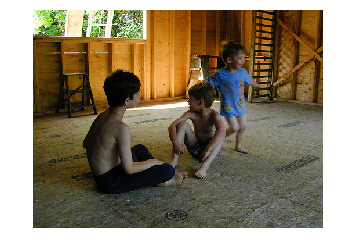

group of people are walking down street


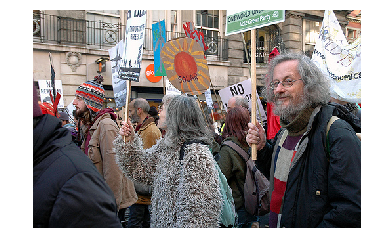

boy in red shirt is riding scooter on the sidewalk


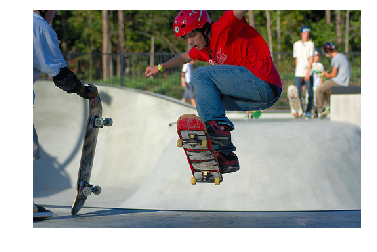

car drives through mud puddle


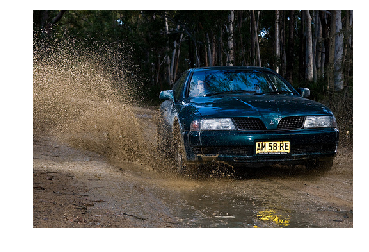

group of people are standing in front of fountain


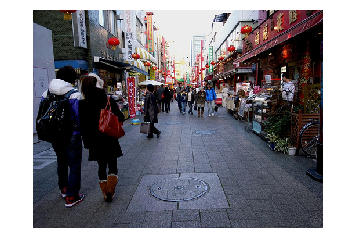

little boy in blue shirt is sitting on construction floor with his feet up


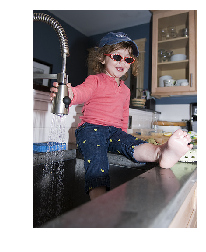

two horses are sitting on the ground


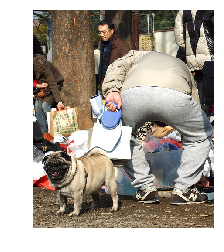

man in red shirt is sitting on top of rock


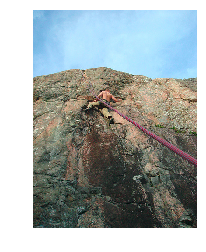

man in red coat and leather gloves is speaking


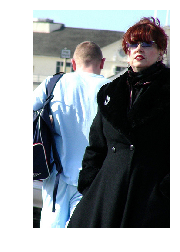

football players are tackling each other


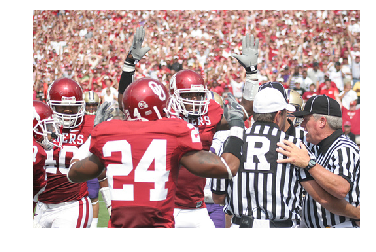

two climbers climb natural rock climbing


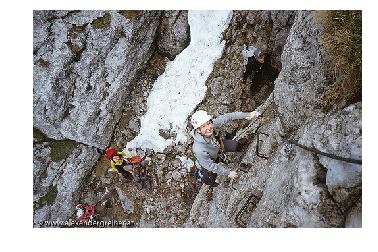

person in blue shirt and cast shorts is holding sleeping animals


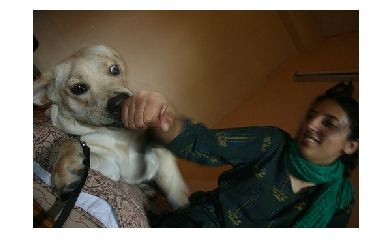

man in red shirt is wakeboarding in the water


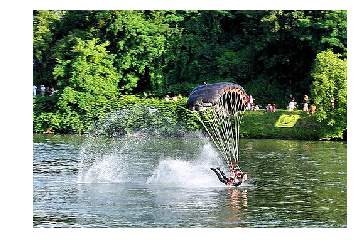

brown dog is running through the grass


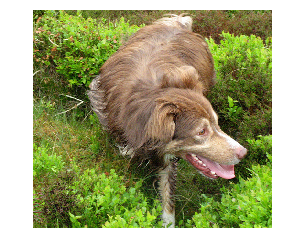

woman in red jacket and black jacket is standing in front of snowy landscape


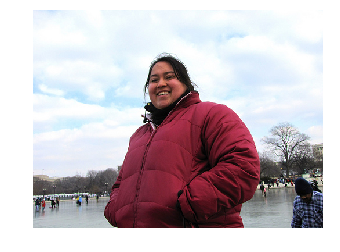

little girl in blue dress is running in the grass


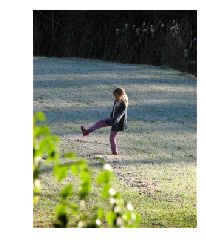

dog is jumping over hurdle


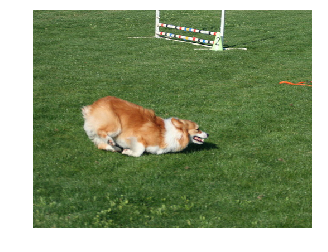

two men are wearing blue protective and one power is bending


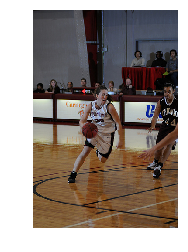

two men are walking down the street


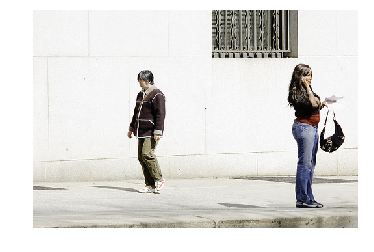

little boy in blue shirt and blue cast wheel is sitting on floor with towel


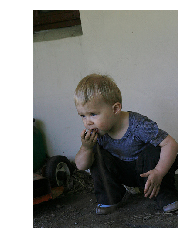

group of people are walking down street


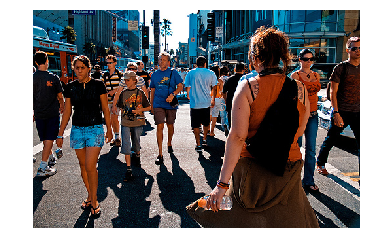

two women are sitting on seat and sitting on bus


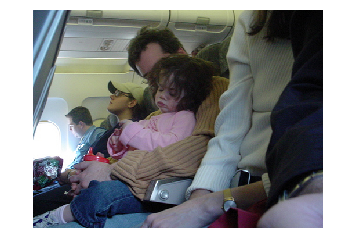

man in red shirt and khaki shorts is holding onto ropes


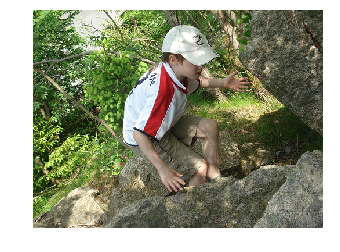

man and woman are walking on the path


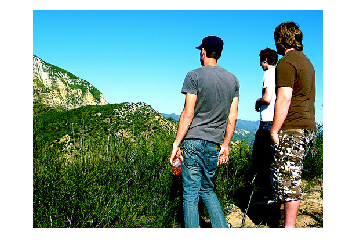

little boy in pajamas crawls on bed


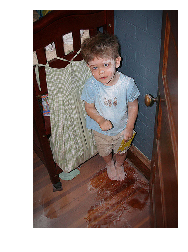

man in construction is jumping off his skateboard


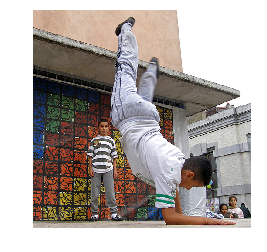

man in red jacket is skiing down snowy hill


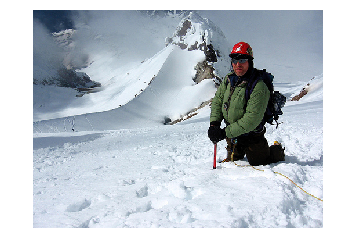

black dog is running through the water


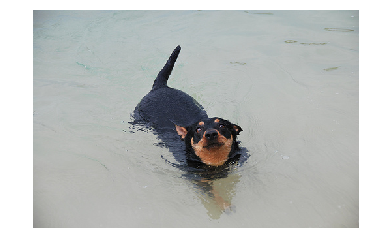

group of people are walking on beach


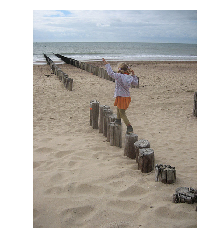

boy in blue shirt and blue shorts is on the arm of the air


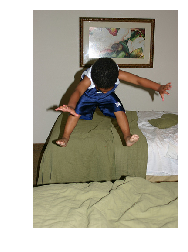

basketball player in white uniform is basketball for the player in white for the ball


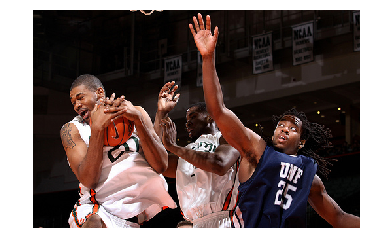

two girls are sitting on tire platform


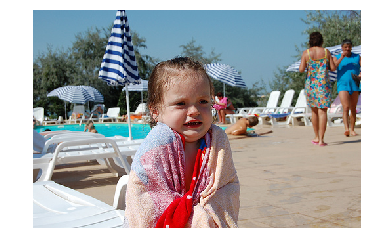

group of people are walking down city street


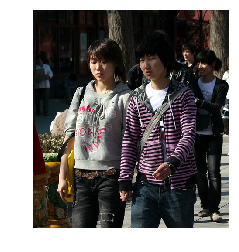

boy in blue shirt is jumping off of the air


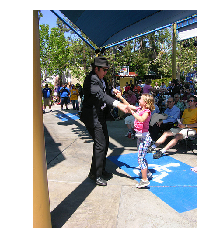

black and white dog is jumping in pool


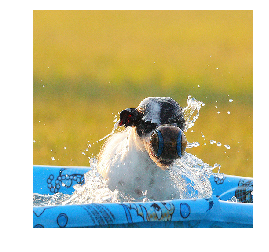

little girl in pink shirt is sitting on swing


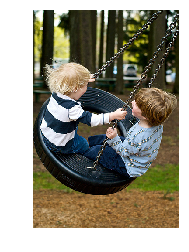

man with glasses stands on top of mountain


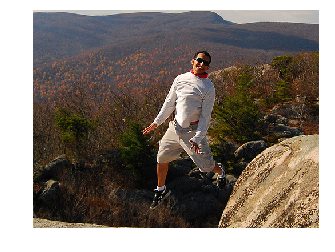

black dog runs on beach


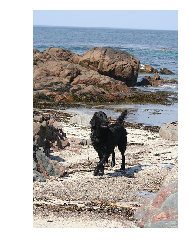

man in blue shirt is standing in front of some rows


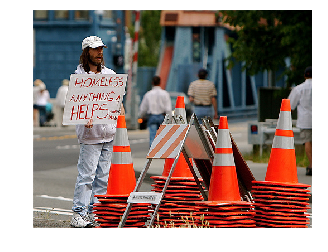

man and woman are standing on the edge of river


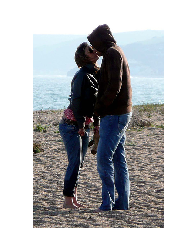

two women are sitting on the concrete of parking lot


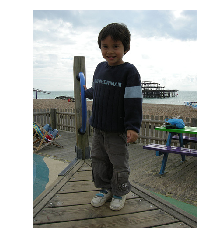

the motorcycle rider is riding green race around track


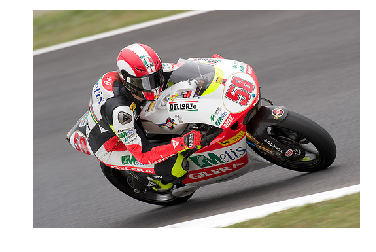

two men are playing game on court


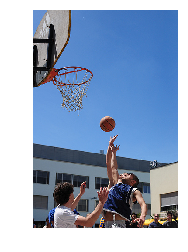

two people are riding bicycles in the desert


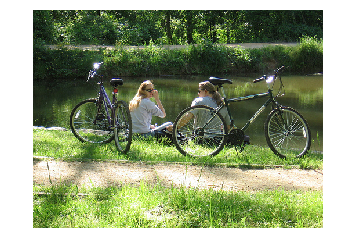

two women in bathing suits are sitting on bench


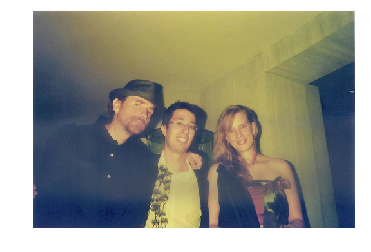

surfer in black wetsuit is riding wave


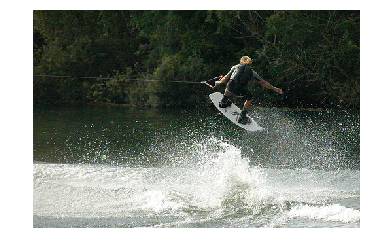

dog with red collar is running through the water


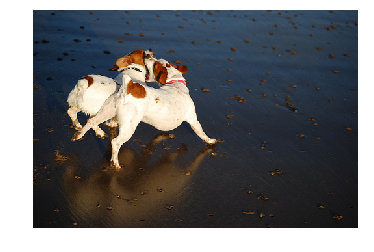

man in jeans is helping to pull cart in parking lot


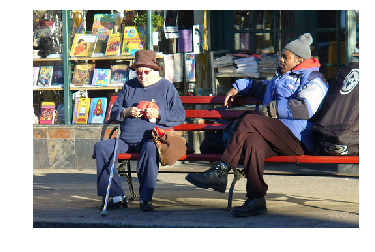

black and white dog is running through field


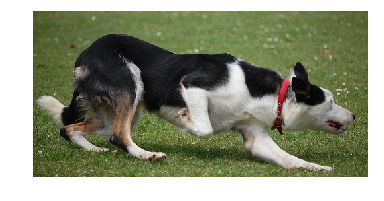

group of people are riding horses on the path


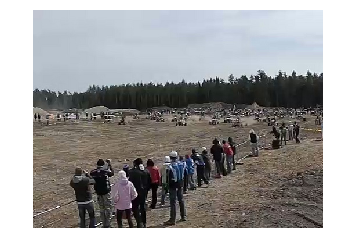

collie is running through the grass


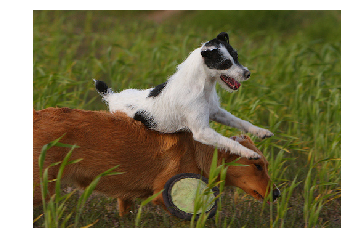

two men are playing basketball


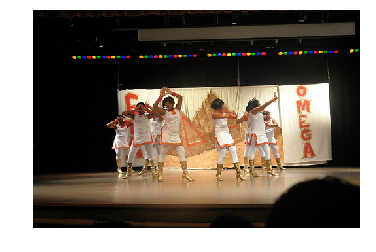

man in bathing suit is jumping into lake


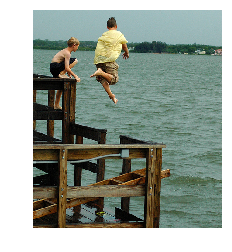

boy in red shirt is jumping off tire swing


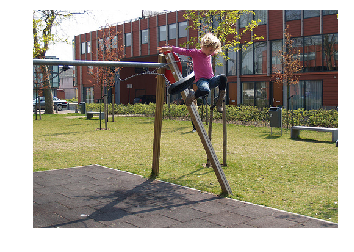

man on bike is jumping over wooden ramp


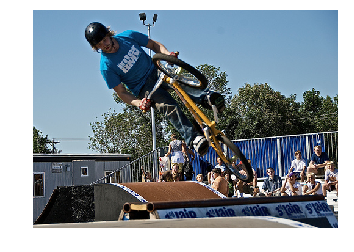

girl in green jumper is touching in the countryside


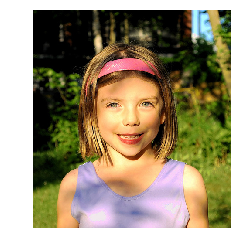

snowboarder is airborne in the air


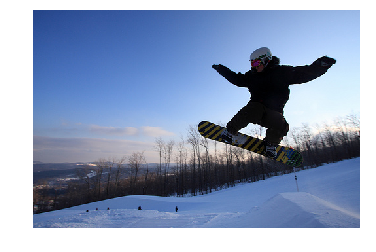

young girl in pink shirt is walking on the beach


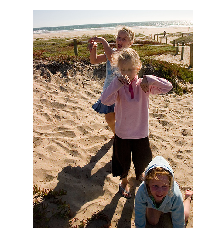

group of people are walking along the street


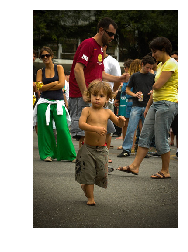

man in red shirt is rock climbing


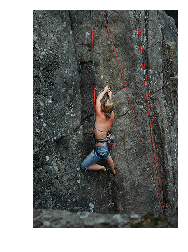

man in black shirt and jeans is standing on top of the arms


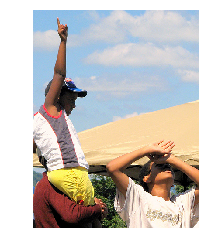

two people are riding atv atv through the woods


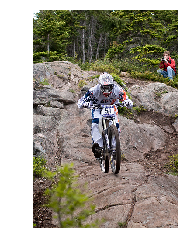

two men in white shorts are sitting on top of rock


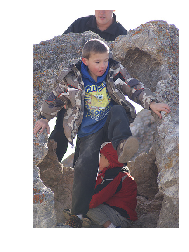

man is flipping on his skateboard in the air


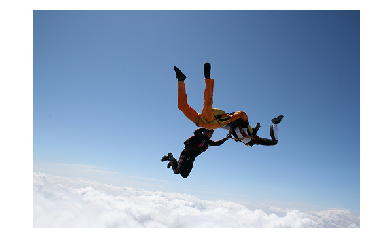

woman in black shirt and black shorts is walking on the concrete


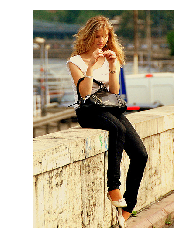

dog is running through shallow water


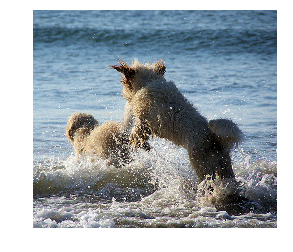

woman in headscarf is standing on the grass reading book


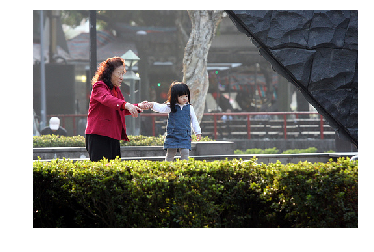

two dogs are running through field of grass


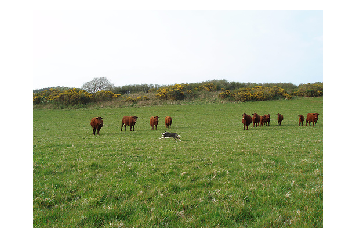

little girl in red shirt is sitting in the air


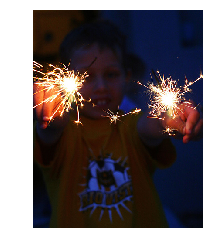

two young ladies are sitting on the edge of wagon


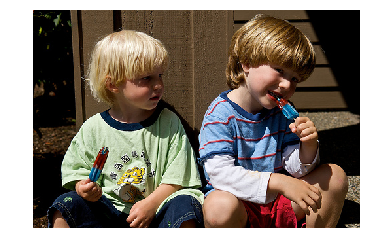

black dog is running through the snow


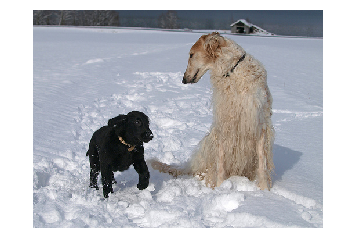

dog runs on the beach


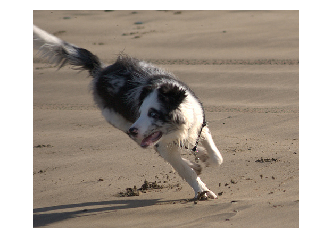

two girls in bathing suits are standing on trampoline


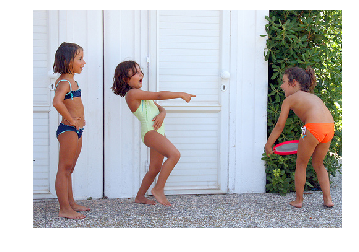

two hockey teams are playing hockey hockey game


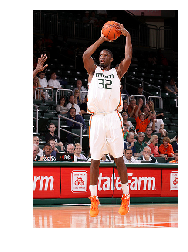

little boy in blue shirt is holding up sign to drive


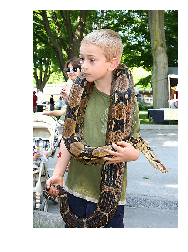

boy kicks soccer ball in the grass


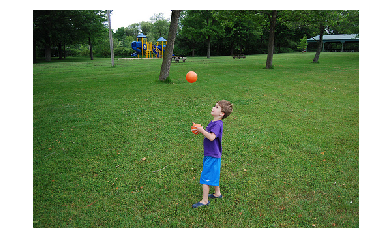

man in black shirt and black jacket is wearing helmet


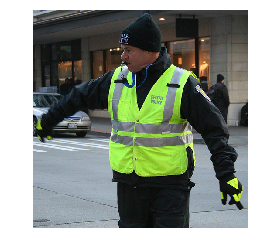

young boy in swim trunks is playing in the ocean


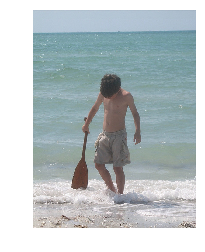

two dogs are playing in murky water


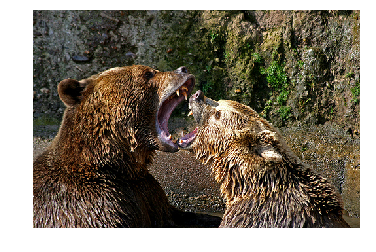

In [107]:
for i in range(0, 100):
    display_img_and_caption(i)

In [108]:
# end

In [109]:
# Load and test on images

In [110]:
import cv2

In [111]:
def encode_image_2(img):
    img = preprocess_img_2(img)
    feature_vector = model_new.predict(img)
    feature_vector = feature_vector.reshape((-1,))
    #print(feature_vector.shape)
    return feature_vector
def preprocess_img_2(img):
    #img = load_img(img, target_size=(224,224))
    #img = img_to_array(img)
    img = np.expand_dims(img, axis = 0)
    img = preprocess_input(img)
    return img

In [112]:
def load_and_predict(im): # takes as input the image name
    name = im
    im = plt.imread(name + ".jpg")
    im = cv2.resize(im, (224,224))
    im = encode_image_2(im)
    photo_2048 = im.reshape((1, 2048))
    i = plt.imread(name+'.jpg')
    caption = predict_caption(photo_2048)
    print(caption)
    plt.axis("off")
    plt.imshow(i)

boy in yellow shirt is wakeboarding on large ski


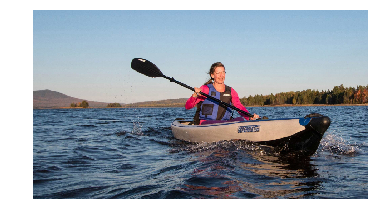

In [113]:
load_and_predict("pic3")

two men in uniforms are playing soccer


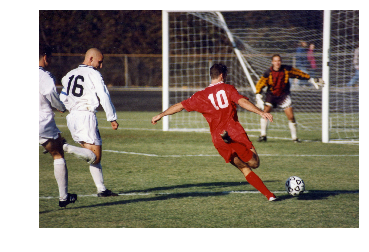

In [114]:
load_and_predict("pic4")

In [115]:
# end